```
Intensity Transformation and Spatial Filtering
@arashsm79
```
* [Converting RGB to Grayscale](#RGB-to-Grayscale)
* [Finding min and max of intensity](#Finding-min-and-max-of-intensity)
* [Finding the mean of intensity](#Finding-the-mean-of-intensity)
* [Finding the variance of intensity](#Finding-the-variance-of-intensity)
* [Detecting vertical edges](#Detecting-vertical-edges)
* [Detecting horizontal edges](#Detecting-horizontal-edges)
* [Detecting vertical and horizontal edges](#Detecting-vertical-and-horizontal-edges)
* [Detecting diagonal edges](#Detecting-diagonal-edges)
* [Applying the Laplacian edge detector](#Applying-the-Laplacian-edge-detector)
* [Bit slicing using bits 8 and 7](#Bit-slicing-using-bits-8-and-7)
* [Bit slicing using bits 8 and 7 and 6](#Bit-slicing-using-bits-8-and-7-and-6)
* [Bit slicing using bits 4 to 1](#Bit-slicing-using-bits-4-to-1)
* [Calculating the histogram](#Calculating-the-histogram)
* [Histogram and contrast](#Histogram-and-contrast)
* [Reducing brightness](#Reducing-brightness)
* [Calculating the histogram of a bit sliced image](#Calculating-the-histogram-of-a-bit-sliced-image)
* [Adding salt and pepper noise to an image](#Adding-salt-and-pepper-noise-to-an-image)
* [Applying mean filter](#Applying-mean-filter)
* [Applying gaussian filter](#Applying-gaussian-filter)
* [Applying median filter](#Applying-median-filter)
* [Applying max filter](#Applying-max-filter)
* [Applying min filter](#Applying-min-filter)
* [Comparing statistical filters](#Comparing-statistical-filters)
* [Scaling up an image by a factor of 2](#Scaling-up-an-image-by-a-factor-of-2)
* [Rotating an image by 30 degrees](#Rotating-an-image-by-30-degrees)
* [Streching vertically](#Streching-vertically)
* [Streching horizontally](#Streching-horizontally)
* [Streching horizontally and vertically](#Streching-horizontally-and-vertically)

In [170]:
import numpy as np
import math
import matplotlib.pyplot as plt
import random as rnd
from PIL import Image

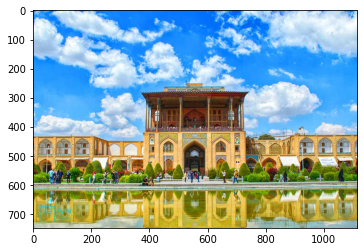

In [171]:
# Load the image as a numpy array
test_img = np.array(Image.open("images/alighapoo.jpg"))
plt.imshow(test_img)

## RGB to Grayscale

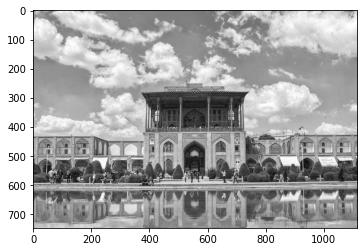

In [172]:
# Create an empty image
test_img_gray = np.zeros((test_img.shape[0], test_img.shape[1]), dtype=int)

# Take the average of each pixel and put it in testest_img_gray
for i in range(test_img.shape[0]):
    for j in range(test_img.shape[1]):
        average = (int(test_img[i][j][0]) + test_img[i][j][1] + test_img[i][j][2])/3
        test_img_gray[i][j] = average
plt.imshow(test_img_gray, cmap='gray')

## Finding min and max of intensity

In [173]:
max_lum = 0
min_lum = 0

for i in range(test_img_gray.shape[0]):
    for j in range(test_img_gray.shape[1]):
        max_lum = max(test_img_gray[i][j], max_lum)
        min_lum = min(test_img_gray[i][j], min_lum)

print("Maximum intensity of the gray image:", max_lum)
print("Minimum intensity of the gray image:", min_lum)

Maximum intensity of the gray image: 255
Minimum intensity of the gray image: 0


## Finding the mean of intensity

In [174]:
sum_lum = 0

for i in range(test_img_gray.shape[0]):
    for j in range(test_img_gray.shape[1]):
        sum_lum = sum_lum + test_img_gray[i][j]
test_img_gray_size = test_img_gray.shape[0] * test_img_gray.shape[1]
test_img_gray_average_intensity = float(sum_lum)/test_img_gray_size
print("Average intensity of the gray image:", test_img_gray_average_intensity)

Average intensity of the gray image: 155.73185004695915


## Finding the variance of intensity

In [175]:
var_sum_lum = 0.0
for i in range(test_img_gray.shape[0]):
    for j in range(test_img_gray.shape[1]):
        var_sum_lum = var_sum_lum + pow(test_img_gray_average_intensity - test_img_gray[i][j], 2)
test_img_gray_intensity_variance = float(var_sum_lum) / test_img_gray_size
print("Intensity variance of the gray image:", test_img_gray_intensity_variance)

Intensity variance of the gray image: 2949.8936824485677


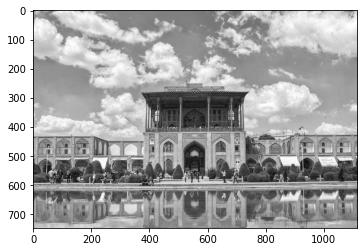

In [176]:
# Load the image as a numpy array
alighapoo = np.array(Image.open("images/alighapoo.jpg"))
# Create an empty image
alighapoo_gray = np.zeros((alighapoo.shape[0], alighapoo.shape[1]), dtype=int)
# Take the average of each pixel
for i in range(alighapoo.shape[0]):
    for j in range(alighapoo.shape[1]):
        average = (int(alighapoo[i][j][0]) + alighapoo[i][j][1] + alighapoo[i][j][2])/3
        alighapoo_gray[i][j] = average
plt.imshow(alighapoo_gray, cmap='gray')

In [177]:
# a simple helper function that adds 2 extra rows in the beginning and the end and 2 extra columns in the beginning and the end
def extend_image(img):
    img_h, img_w = img.shape[0:2]
    output_img = np.zeros((img_h + 4, img_w + 4))
    # put the original picture in the middle
    output_img[2: img_h + 2, 2: img_w + 2] = img
    # fill in the 2 columns at the beginning
    output_img[2: img_h + 2, 0:2] = img[:, 0:1]
    # fill in the 2 columns at the end
    output_img[2: img_h + 2, img_w + 2: img_w + 4] = img[:, img_w - 1: img_w]
    # fill in the 2 rows at the beginning
    output_img[0:2, 2: img_w + 2] = img[0:1, :]
    # fill in the 2 rows at the end
    output_img[img_h + 2: img_h + 4, 2: img_w + 2] = img[img_h - 1: img_h, :]
    # fill in the for corners
    # up left
    output_img[0:2, 0:2] = img[0, 0]
    # down left
    output_img[img_h + 2: img_h + 4, 0:2] = img[img_h - 1, 0]
    # up right
    output_img[img_h + 2: img_h + 4, img_w +
               2: img_w + 4] = img[img_h - 1, img_w - 1]
    # up left
    output_img[0:2, img_w + 2: img_w + 4] = img[0, img_w - 1]
    return output_img.astype(np.int64)

In [178]:
def convolve(image, kernel, offset, height, width):
    output_image = np.zeros(image.shape)
    for col in range(offset, width + offset):
        for row in range(offset, height + offset):
            kernel_sum = 0
            for h in range(-1, 2):
                for k in range(-1, 2):
                    kernel_sum = kernel_sum + image[row + h][col + k] * kernel[h][k]
            output_image[row][col] = kernel_sum
    return output_image

In [220]:
# show the image with a better size
def show_image_actual_size(img, cmap=None, dpi=100):
    dpi = dpi
    height, width = img.shape[0], img.shape[1]
    figsize = width / float(dpi), height / float(dpi)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.imshow(img, cmap=cmap)
    plt.show()

In [180]:
alighapoo_gray_extended = extend_image(alighapoo_gray)

## Detecting horizontal edges

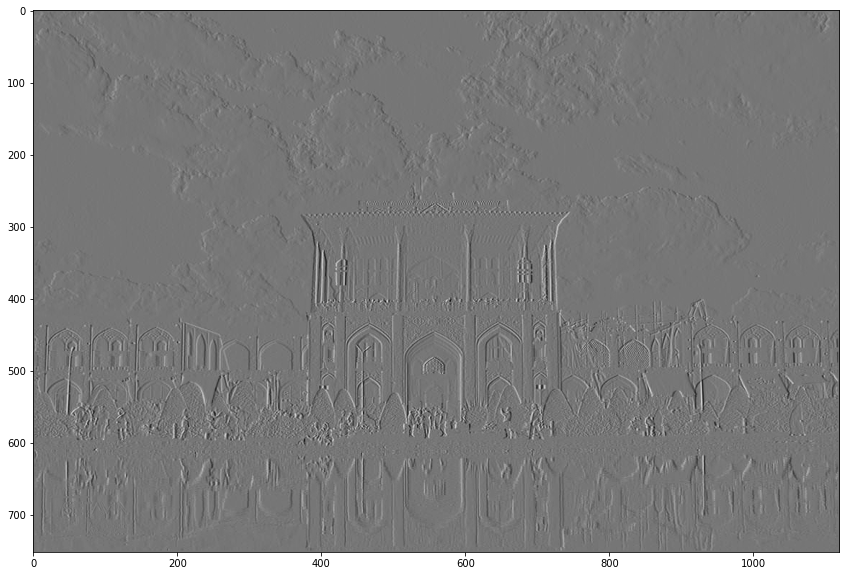

In [181]:
horizontal_edge_kernel = [[0, 0, 0],
                          [-1, 2, -1],
                          [0, 0, 0]]
alighapoo_horiz_edge = convolve(alighapoo_gray_extended, horizontal_edge_kernel, 2, alighapoo_gray.shape[0], alighapoo_gray.shape[1])
show_image_actual_size(alighapoo_horiz_edge, cmap='gray')

## Detecting vertical edges

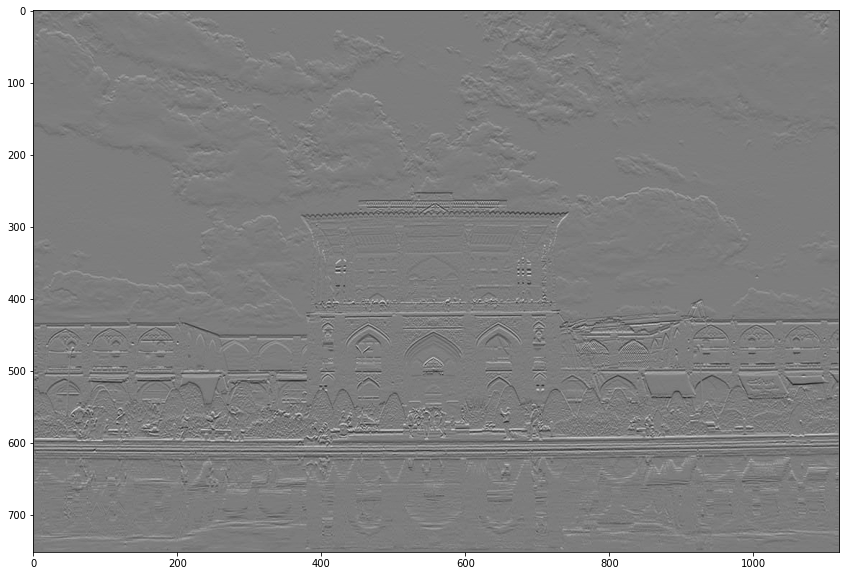

In [182]:
vertical_edge_kernel = [[0, -1, 0],
                        [0, 2, 0],
                        [0, -1, 0]]
alighapoo_vertical_edge = convolve(alighapoo_gray_extended, vertical_edge_kernel, 2, alighapoo_gray.shape[0], alighapoo_gray.shape[1])
show_image_actual_size(alighapoo_vertical_edge, cmap='gray')

## Detecting vertical and horizontal edges

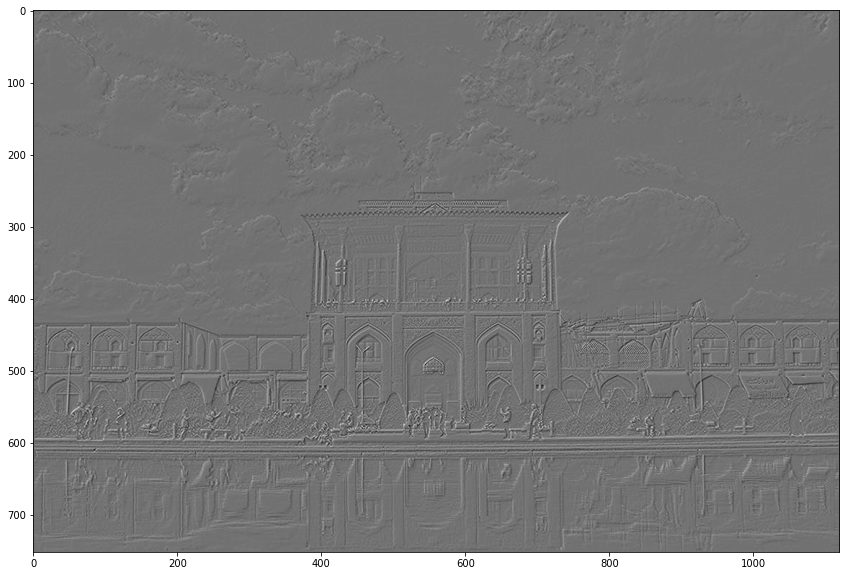

In [183]:
horiz_vert_edge_kernel = [[0, -1, 0],
                         [-1, 4, -1],
                         [0, -1, 0]]
alighapoo_horiz_vert_edge = convolve(alighapoo_gray_extended, horiz_vert_edge_kernel, 2, alighapoo_gray.shape[0], alighapoo_gray.shape[1])
show_image_actual_size(alighapoo_horiz_vert_edge, cmap='gray')

## Detecting diagonal edges


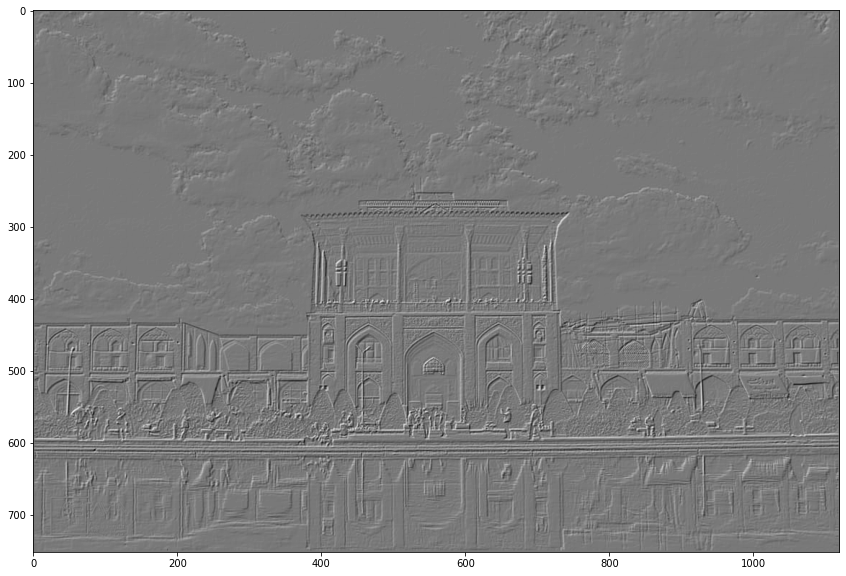

In [184]:
diag_edge_kernel = [[-1, 0, -1],
                    [0, 4, 0],
                    [-1, 0, -1]]
alighapoo_diag_edge = convolve(alighapoo_gray_extended, diag_edge_kernel, 2, alighapoo_gray.shape[0], alighapoo_gray.shape[1])
show_image_actual_size(alighapoo_diag_edge, cmap='gray')

## Applying the Laplacian edge detector
`laplacian` is not equal to `horizontal + vertical + diagonal`. Because after applying the horizontal edge detection kernel, a lot of the information about the picture is lost and thus, applying the rest of the filters yields nothing good.

Laplacian:


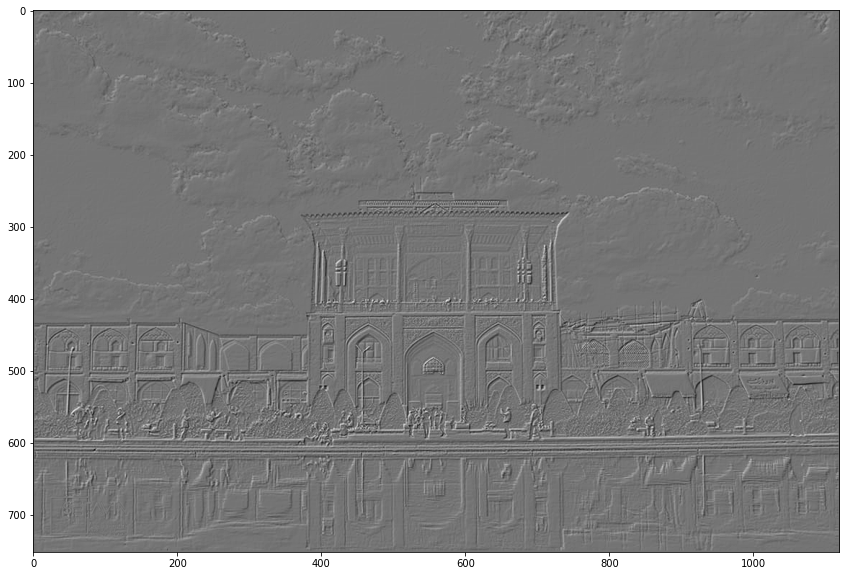

In [185]:
laplacian_edge_kernel = [[-1, -1, -1],
                    [-1, 8, -1],
                    [-1, -1, -1]]
alighapoo_laplacian_edge = convolve(alighapoo_gray_extended, laplacian_edge_kernel, 2, alighapoo_gray.shape[0], alighapoo_gray.shape[1])
print("Laplacian:")
show_image_actual_size(alighapoo_laplacian_edge, cmap='gray')

Horiz + Vert + Diag:


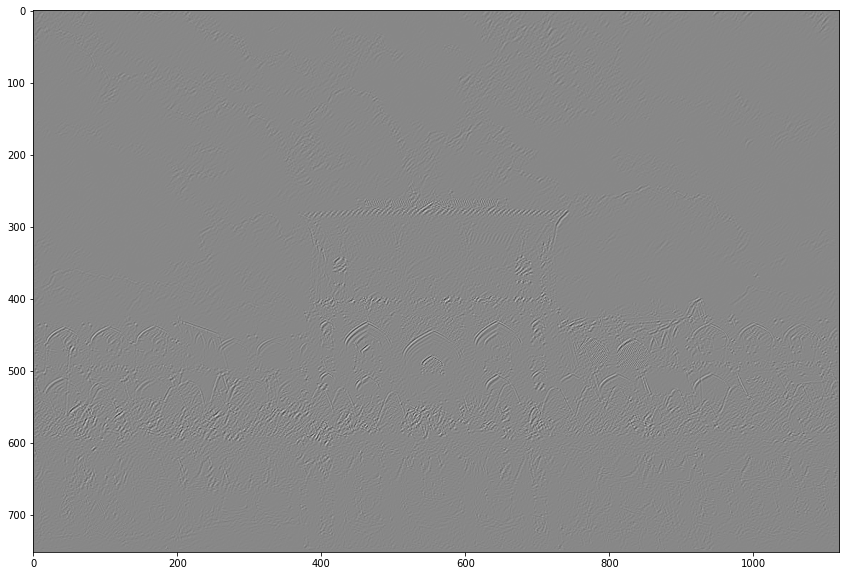

In [186]:
diag_edge_kernel1 = [[-1, 0, 0],
                    [0, 2, 0],
                    [0, 0, -1]]
diag_edge_kernel2 = [[-1, 0, 0],
                    [0, 2, 0],
                    [0, 0, -1]]

alighapoo_pipeline1 = convolve(alighapoo_gray_extended, horizontal_edge_kernel, 2, alighapoo_gray.shape[0], alighapoo_gray.shape[1])
alighapoo_pipeline2 = convolve(alighapoo_pipeline1, vertical_edge_kernel, 2, alighapoo_gray.shape[0], alighapoo_gray.shape[1])
alighapoo_pipeline3 = convolve(alighapoo_pipeline2, diag_edge_kernel1, 2, alighapoo_gray.shape[0], alighapoo_gray.shape[1])
alighapoo_pipeline4 = convolve(alighapoo_pipeline3, diag_edge_kernel2, 2, alighapoo_gray.shape[0], alighapoo_gray.shape[1])
print("Horiz + Vert + Diag:")
show_image_actual_size(alighapoo_pipeline4, cmap='gray')

# Exercise 3

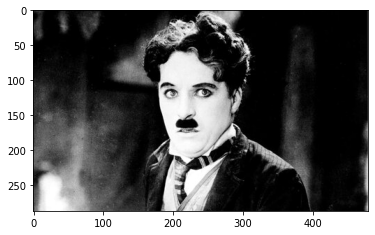

In [187]:
# Load the image as a numpy array
charlie = np.array(Image.open("images/charlie.jpeg"), dtype=np.uint8)
plt.imshow(charlie, cmap='gray')

## Bit slicing using bits 8 and 7


8, 7 bit-plane:


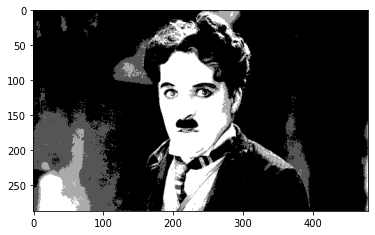

In [188]:
# 8, 7 bit slice
charlie_8_7 = np.zeros((charlie.shape[0], charlie.shape[1]), dtype=np.uint8)
for i in range(charlie.shape[0]):
    for j in range(charlie.shape[1]):
        charlie_8_7[i][j] = charlie[i][j] & 0b11000000
print("8, 7 bit-plane:")
plt.imshow(charlie_8_7, cmap='gray')

## Bit slicing using bits 8 and 7 and 6


8, 7, 6 bit-plane:


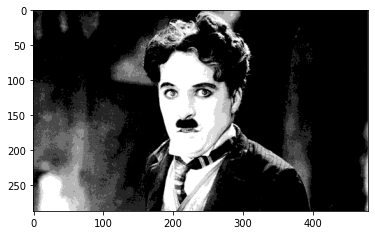

In [189]:
# 8, 7, 6 bit slice
charlie_8_7_6 = np.zeros((charlie.shape[0], charlie.shape[1]), dtype=np.uint8)
for i in range(charlie.shape[0]):
    for j in range(charlie.shape[1]):
        charlie_8_7_6[i][j] = charlie[i][j] & 0b11100000
print("8, 7, 6 bit-plane:")
plt.imshow(charlie_8_7_6, cmap='gray')

## Bit slicing using bits 4 to 1


4, 3, 2, 1 bit-plane:


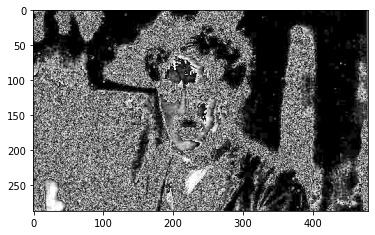

In [190]:
# 4, 3, 2, 1 bit slice
charlie_4_3_2_1 = np.zeros((charlie.shape[0], charlie.shape[1]), dtype=np.uint8)
for i in range(charlie.shape[0]):
    for j in range(charlie.shape[1]):
        charlie_4_3_2_1[i][j] = charlie[i][j] & 0b00001111
print("4, 3, 2, 1 bit-plane:")
plt.imshow(charlie_4_3_2_1, cmap='gray')

# Exercise 4

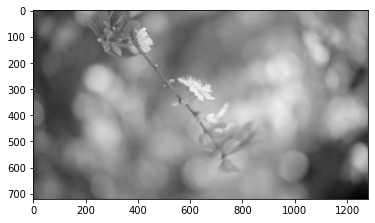

In [191]:
# Load the image as a numpy array
hist_img_colored = np.array(Image.open("images/histogram.jpeg"), dtype=np.uint8)
# Create an empty image
hist_img = np.zeros((hist_img_colored.shape[0], hist_img_colored.shape[1]), dtype=int)
# Take the average of each pixel
for i in range(hist_img_colored.shape[0]):
    for j in range(hist_img_colored.shape[1]):
        average = (int(hist_img_colored[i][j][0]) + hist_img_colored[i][j][1] + hist_img_colored[i][j][2])/3
        hist_img[i][j] = average
plt.imshow(hist_img, cmap='gray')

## Calculating the histogram


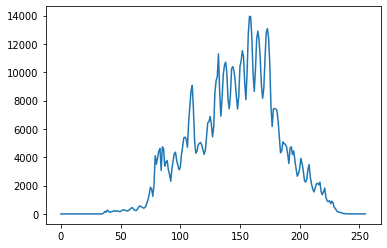

In [192]:
hist = [0] * 256
for i in range(hist_img.shape[0]):
    for j in range(hist_img.shape[1]):
        hist[hist_img[i][j]] = hist[hist_img[i][j]] + 1
hist_dom = np.arange(0, 256, 1, dtype=np.uint8)
plt.plot(hist_dom, hist)

## Histogram and contrast

Most of the values are between 100 and 200 thus this is a low contrast picture.

## Reducing brightness


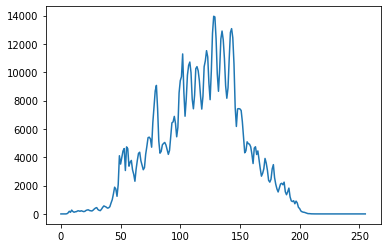

In [193]:
hist_img_minus_30 = np.zeros((hist_img.shape[0], hist_img.shape[1]), dtype=np.uint8)
for i in range(hist_img.shape[0]):
    for j in range(hist_img.shape[1]):
        hist_img_minus_30[i][j] = hist_img[i][j] - 30
hist_minus_30 = [0] * 256
for i in range(hist_img.shape[0]):
    for j in range(hist_img.shape[1]):
        hist_minus_30[hist_img_minus_30[i][j]] = hist_minus_30[hist_img_minus_30[i][j]] + 1
plt.plot(hist_dom, hist_minus_30)

The histogram is shifted to the left by 30

## Calculating the histogram of a bit sliced image


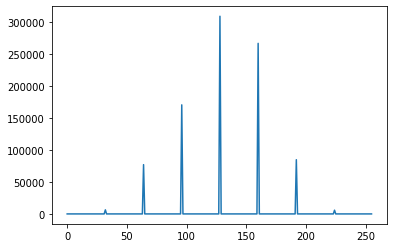

In [194]:
# 8, 7, 6 bit slice
hist_img_8_7_6 = np.zeros((hist_img.shape[0], hist_img.shape[1]), dtype=np.uint8)
for i in range(hist_img.shape[0]):
    for j in range(hist_img.shape[1]):
        hist_img_8_7_6[i][j] = hist_img[i][j] & 0b11100000
hist_bit_plane = [0] * 256
for i in range(hist_img_8_7_6.shape[0]):
    for j in range(hist_img_8_7_6.shape[1]):
        hist_bit_plane[hist_img_8_7_6[i][j]] = hist_bit_plane[hist_img_8_7_6[i][j]] + 1
plt.plot(hist_dom, hist_bit_plane)

Only `2^3 = 8` numbers can be represented using 3 bits. Therefore, there can at most be 8 spikes in the histogram. Since some numbers may simply don't appear in the image intensity, here we are seeing 7 spikes corresponding to 7 numbers. (the missing number is 00000000. When all the three bits are zero we get this number. There aren't any pixels in the image that have their 8, 7, 6th bit all equal to zero at the same time, thus, we can't see any value for 0)

# Exercise 5

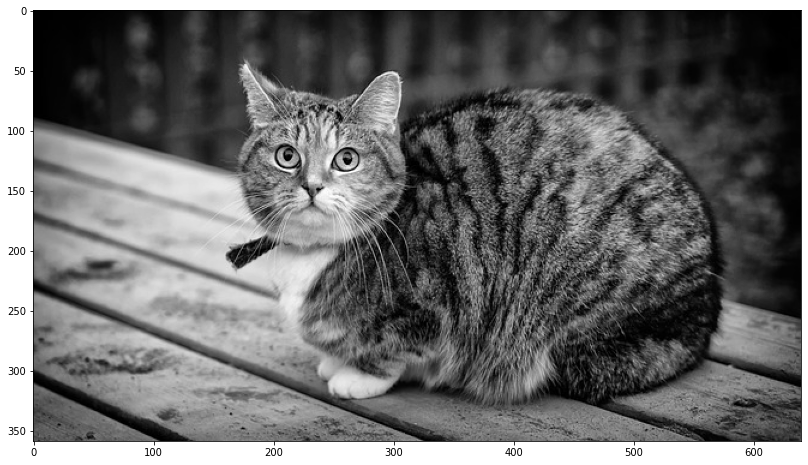

In [195]:
# Load the image as a numpy array
kitty_img_rgb = np.array(Image.open("images/kitty.jpg"))
kitty_img = np.zeros((kitty_img_rgb.shape[0], kitty_img_rgb.shape[1]))
for i in range(kitty_img_rgb.shape[0]):
    for j in range(kitty_img_rgb.shape[1]):
        kitty_img[i][j] = int(kitty_img_rgb[i][j][0])
show_image_actual_size(kitty_img, dpi=60, cmap='gray')

In [196]:
kitty_img_extended = extend_image(kitty_img)

## Adding salt and pepper noise to an image
We can either
* Add pixels with value 0 or 255 as noise (I chose this one)

or
* Add pixels with a random value between 0 and 255 

In [197]:
# Noice percentage
chance = 10
kitty_img_noisy = kitty_img_extended.copy()
for i in range(kitty_img_noisy.shape[0]):
    for j in range(kitty_img_noisy.shape[1]):
        if rnd.randint(1, 100) <= chance:
#            kitty_img_noisy[i][j] = rnd.randint(0, 255)
            if rnd.randint(1, 100) <= 50:
                kitty_img_noisy[i][j] = 0
            else:
                kitty_img_noisy[i][j] = 255

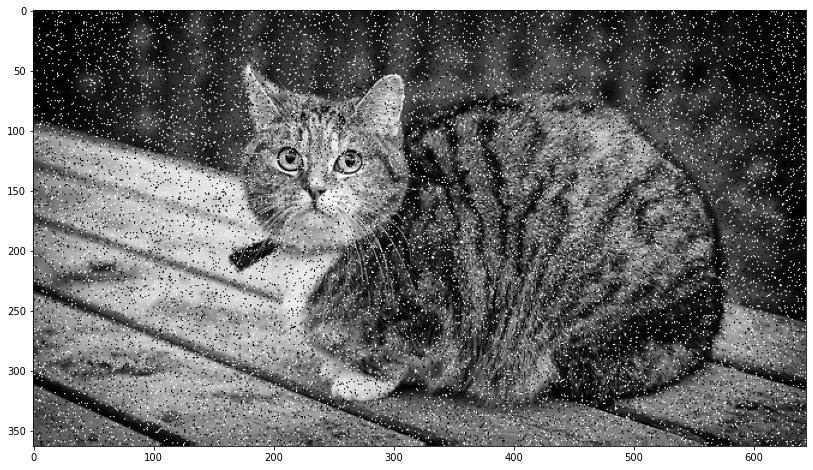

In [198]:
show_image_actual_size(kitty_img_noisy, dpi=60, cmap='gray')

## Applying mean filter


In [199]:
average_kernel = 1/9 * np.array([
                        [1, 1, 1],
                        [1, 1, 1],
                        [1, 1, 1]
                        ], dtype=float)
average_kitty = convolve(kitty_img_noisy, average_kernel, 2, kitty_img.shape[0], kitty_img.shape[1])

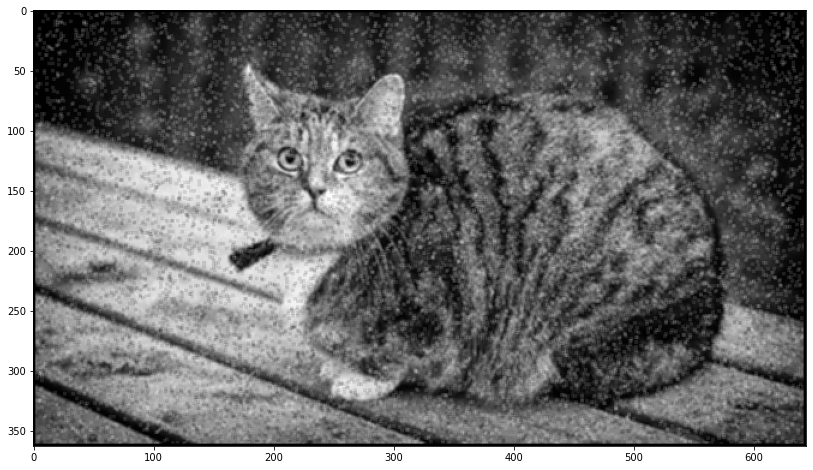

In [200]:
show_image_actual_size(average_kitty, dpi=60, cmap='gray')

## Applying gaussian filter


In [201]:
gaussian_kernel = 1/16 * np.array([
                        [1, 2, 1],
                        [2, 4, 2],
                        [1, 2, 1]
                        ], dtype=float)
gaussian_kitty = convolve(kitty_img_noisy, gaussian_kernel, 2, kitty_img.shape[0], kitty_img.shape[1])

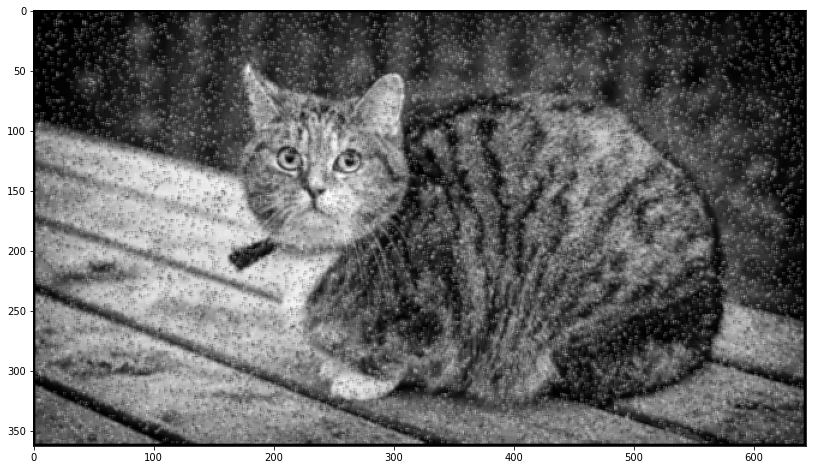

In [202]:
show_image_actual_size(gaussian_kitty, dpi=60, cmap='gray')

## Applying median filter


In [203]:
def nonlinear_convolve(image, func, offset, height, width):
    output_image = np.zeros(image.shape)
    for col in range(offset, width + offset):
        for row in range(offset, height + offset):
            window_pixels = []
            for h in range(-1, 2):
                for k in range(-1, 2):
                    window_pixels.append(image[row + h][col + k])
            output_image[row][col] = func(window_pixels)
    return output_image

In [204]:
median_kitty = nonlinear_convolve(kitty_img_noisy, np.median, 2, kitty_img.shape[0], kitty_img.shape[1])

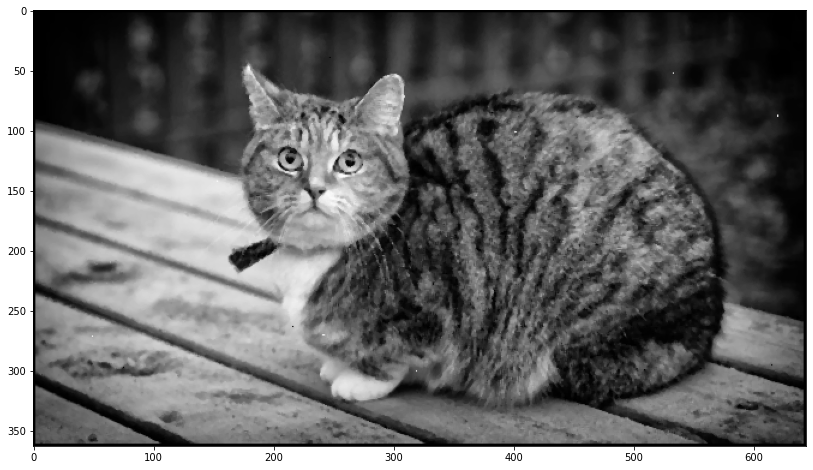

In [205]:
show_image_actual_size(median_kitty, dpi=60, cmap='gray')

## Applying max filter


In [206]:
max_kitty = nonlinear_convolve(kitty_img_noisy, np.max, 2, kitty_img.shape[0], kitty_img.shape[1])

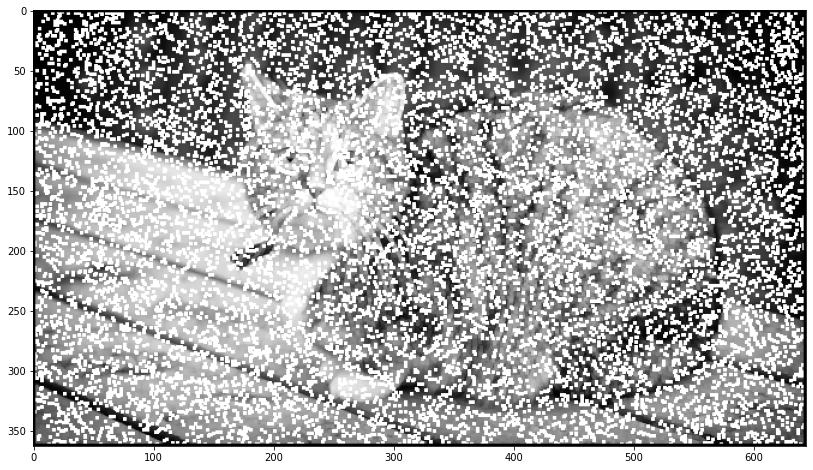

In [207]:
show_image_actual_size(max_kitty, dpi=60, cmap='gray')

## Applying min filter


In [208]:
min_kitty = nonlinear_convolve(kitty_img_noisy, np.min, 2, kitty_img.shape[0], kitty_img.shape[1])

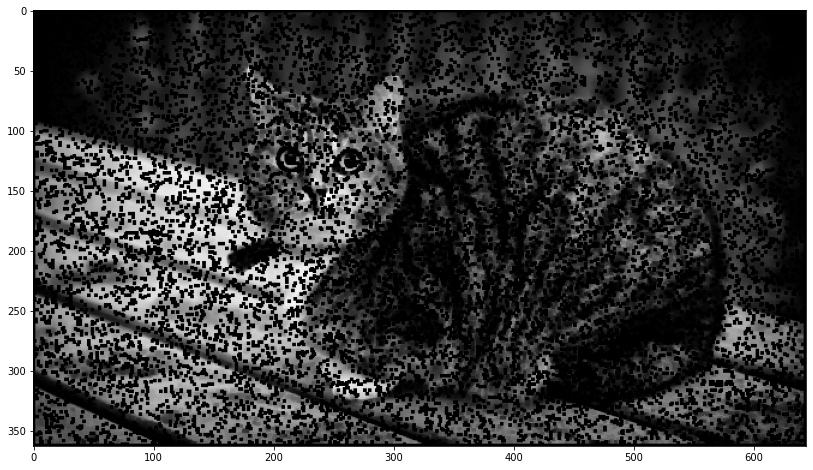

In [209]:
show_image_actual_size(min_kitty, dpi=60, cmap='gray')

## Comparing statistical filters


* mean filter: The effect of the noise is clearly visible. This filter just makes the overal image less sharp and thus the effect of noise is reduced a little
* gaussian filter: Like mean filter the effect of the noise is visible but it retains more features of the photo compared to mean filter. The overal smoothness is increased.
* median filter: This is the best filter among others. The effect of salt and paper noise is pretty much completely removed. However, we can see some artifacts and jaggedness in the image. This filter removes the noise without blurring the image.
* max filter: Not a good filter for this kind of salt and pepper noise. If there is a salt pixel in the windows this filter will pick that pixel, thus we see patches of white everywhere in the image
* min filter: Not a good filter for this kind of salt and pepper noise. If there is a pepper pixel in the windows this filter will pick that pixel, thus we see patches of black everywhere in the image


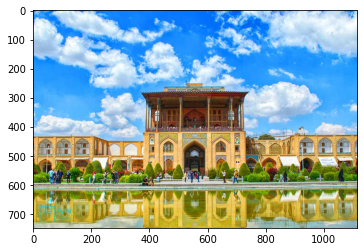

In [210]:
# Load the image as a numpy array
alighapoo_img = np.array(Image.open("images/alighapoo.jpg"))
plt.imshow(alighapoo_img)

## Scaling up an image by a factor of 2


In [211]:
# Scale the image in with the specified value in either direction
def bilinear_interpolation(img, rowScale, colScale):
    # height ~ number of rows = shape[0] ~ y ~ rowScale
    # width ~ number of columns = shape[1] ~ x ~ colScale

    img_h, img_w = img.shape[:2]
    newImg_h, newImg_w = rowScale*img_h, colScale*img_w
    rowScale = 1.0 / rowScale
    colScale = 1.0 / colScale

    newImg = np.zeros((newImg_h, newImg_w, 3), dtype=img.dtype)
    
    for rgb in range(img.shape[2]):
        for y in range(newImg_h):
            for x in range(newImg_w):

                x1 = int(np.floor(x * colScale))
                y1 = int(np.floor(y * rowScale))

                x2 = min(x1 + 1, img_w - 1)
                y2 = min(y1 + 1, img_h - 1)

                x_weight = (colScale * x) - x1
                y_weight = (rowScale * y) - y1

                r1 = (1 - x_weight) * img[y1, x1, rgb] + (x_weight) * img[y1, x2, rgb]
                r2 = (1 - x_weight) * img[y2, x1, rgb] + (x_weight) * img[y2, x2, rgb]
                newImg[y, x, rgb] = int((1 - y_weight) * r1 + (y_weight) * r2)
    return newImg

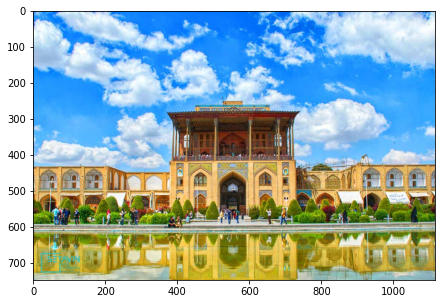

In [222]:
show_image_actual_size(alighapoo_img, dpi=200)

In [214]:
alighapoo_img_2x = bilinear_interpolation(alighapoo_img, 2, 2)

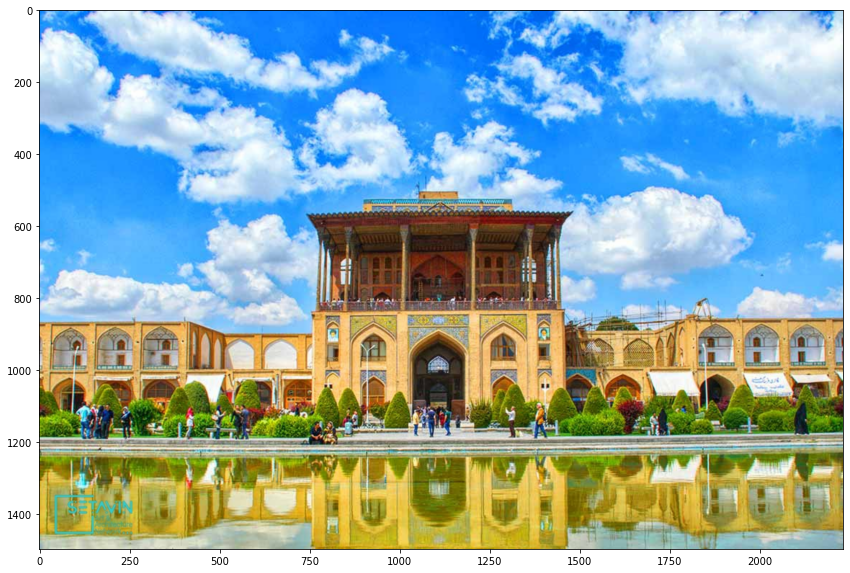

In [223]:
show_image_actual_size(alighapoo_img_2x, dpi=200)

## Rotating an image by 30 degrees


In [224]:
angle = math.pi / 6

T = np.array([
             [math.cos(angle), math.sin(angle)],
             [-math.sin(angle), math.cos(angle)]
             ])

T_inv = np.linalg.inv(T)

transformed_image_height = round(abs(alighapoo_img.shape[0]*math.cos(
    angle)+abs(alighapoo_img.shape[1]*math.sin(angle))))+1
transformed_image_width = round(abs(alighapoo_img.shape[1]*math.cos(
    angle)+abs(alighapoo_img.shape[0]*math.sin(angle))))+1

transformed_image_center_h = round(((transformed_image_height+1)/2)-1)
transformed_image_center_w = round(((transformed_image_width+1)/2)-1)

transformed_image = np.zeros(
    (transformed_image_height, transformed_image_width, alighapoo_img.shape[2]), dtype=int)

def nearest_neighbors_interpolation(i, j, M, T_inv):
    x, y = T_inv @ np.array([i, j])
    center_height = round(((M.shape[0]+1)/2)-1)
    center_width = round(((M.shape[1]+1)/2)-1)
    x = center_height - int(x)
    y = center_width - int(y)
    if x >  M.shape[0] - 1 or y > M.shape[1] - 1 or x < 0 or y < 0:
        return 0
    return M[x, y, ]


for i in range(img_nn.shape[0]):
    for j in range(img_nn.shape[1]):
        x = img_nn.shape[0]-transformed_image_center_h-i-1
        y = img_nn.shape[1]-transformed_image_center_w-j-1
        transformed_image[i, j, :] = nearest_neighbors_interpolation(x, y, alighapoo_img, T_inv)

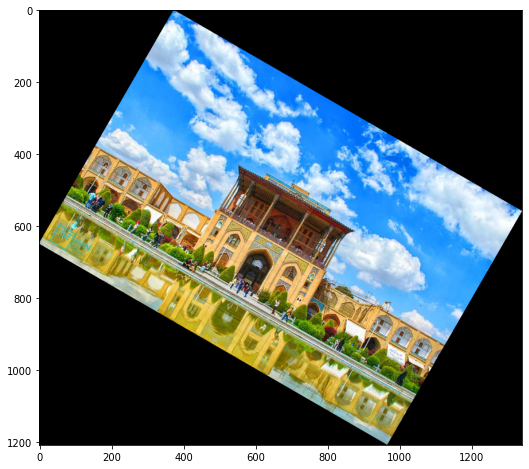

In [225]:
show_image_actual_size(transformed_image, dpi=200)

## Streching horizontally


In [217]:
alighapoo_img_2x_horiz = bilinear_interpolation(alighapoo_img, 1, 2)

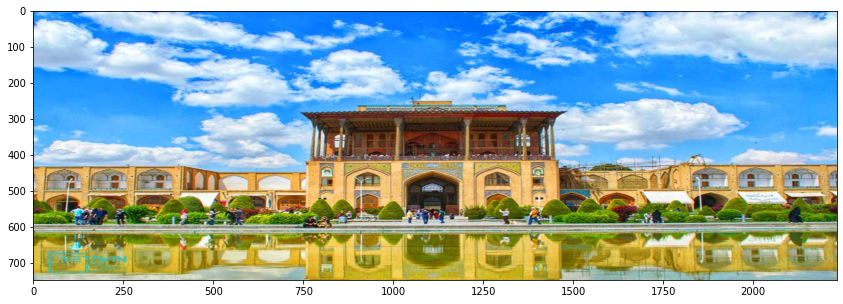

In [226]:
show_image_actual_size(alighapoo_img_2x_horiz, dpi=200)

## Streching vertically


In [227]:
alighapoo_img_2x_vert = bilinear_interpolation(alighapoo_img, 2, 1)

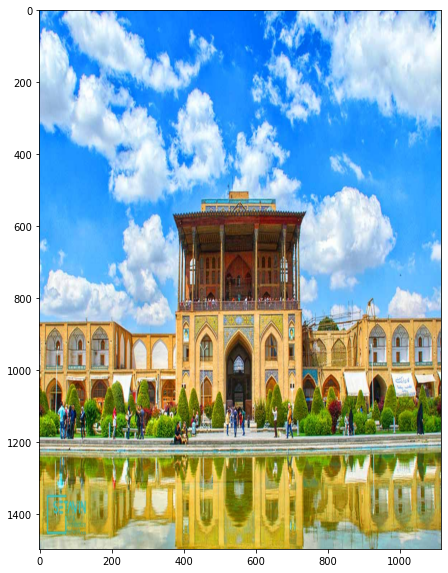

In [228]:
show_image_actual_size(alighapoo_img_2x_vert, dpi=200)

## Streching horizontally and vertically


In [229]:
alighapoo_img_2x_horiz_4x_vert = bilinear_interpolation(alighapoo_img, 4, 2)

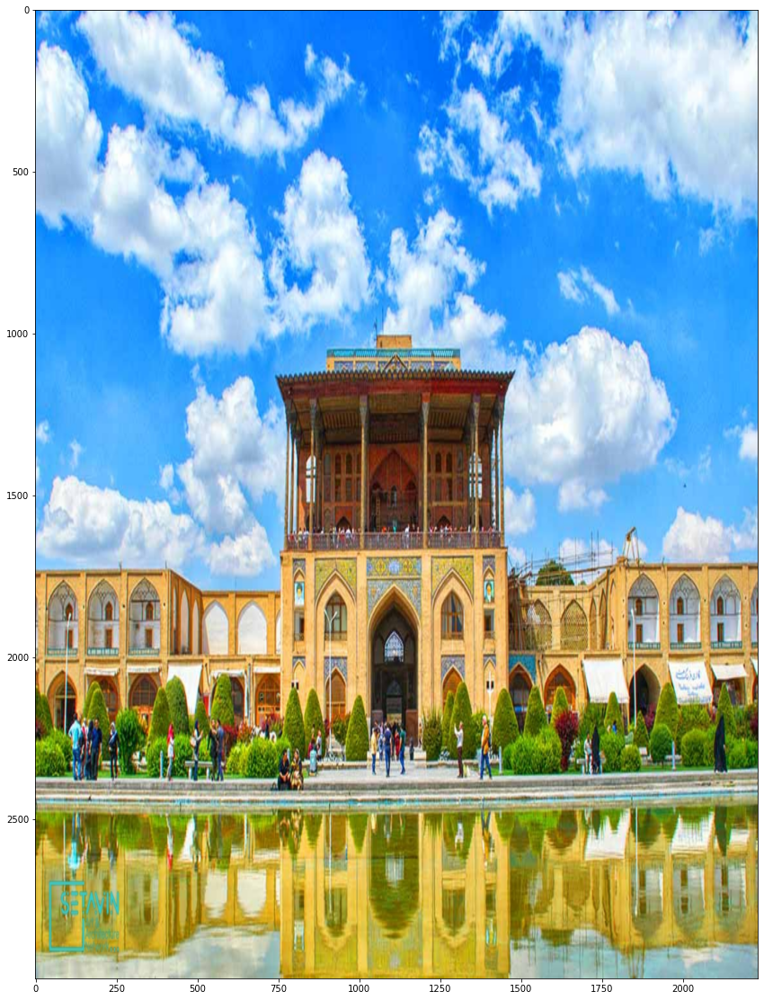

In [230]:
show_image_actual_size(alighapoo_img_2x_horiz_4x_vert, dpi=200)